In [67]:
#connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [70]:
import json, pathlib

nb_path = pathlib.Path("/content/drive/MyDrive/ml_final/Alejandro_Torres_Moran_final_ML.ipynb")
nb = json.loads(nb_path.read_text())
nb["metadata"].pop("widgets", None)
nb_path.write_text(json.dumps(nb, indent=1))
print(" Listo")

 Listo


In [1]:
! pip install ydata_profiling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.8/400.8 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 3.2 MB/s eta 0:00:00


In [56]:
!pip install session-info


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.6/87.6 kB 5.2 MB/s eta 0:00:00


In [57]:
import session_info

In [58]:
session_info.show()


In [2]:
import numpy as np
import pandas as pd
import ydata_profiling as ydata_profiling
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf

sns.set_palette("icefire")
plt.show()

/tmp/ipykernel_607/1691069022.py:3: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  import ydata_profiling as ydata_profiling


In [3]:
 # función para ver todas las filas y columnas

def display_all(df):
   with pd.option_context('display.max_rows', 1000):
       with pd.option_context('display.max_columns', 1000):
           display(df)

In [6]:
#concantena tanto el train con el label. se une las variables predictoras son sus etiquetas
df_train = pd.read_csv("/content/drive/MyDrive/ml_final/training_values.csv")
df_label = pd.read_csv("/content/drive/MyDrive/ml_final/train_labels.csv")

df = pd.concat([df_train,df_label['status_group']],axis=1)
df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


<Axes: xlabel='status_group', ylabel='count'>

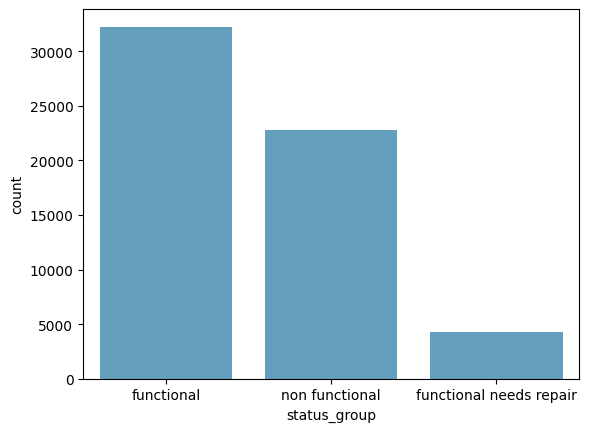

In [7]:
#principlamente para ver si existe desbalanceo de clases
df_train.shape
sns.countplot(x='status_group', data=df)

Explorar datos y pre procesamiento

In [8]:
display_all(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

None

In [9]:
display_all(df.isnull().sum().sort_index()/len(df)*100)

,0
amount_tsh,0.000000
basin,0.000000
construction_year,0.000000
date_recorded,0.000000
district_code,0.000000
extraction_type,0.000000
extraction_type_class,0.000000
extraction_type_group,0.000000
funder,6.122896
gps_height,0.000000


Funder, Installer, Permit, Public Meeting, Scheme Management tienen 5-6% missing.

Subvillage tiene solo 0.6% missing.

Scheme_name tiene 47% missing por tanto será eliminada

In [10]:
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [11]:
display_all(df.describe(include=object)) #para ver variables categóricas

,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,59400,55763,55745,59398,59400,59029,59400,59400,59400,56066,59400,55522,30590,56344,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,356,1896,2145,37399,9,19287,21,125,2092,2,1,11,2695,2,18,13,7,12,5,7,7,8,6,5,5,10,7,3,7,6,3
top,2011-03-15,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,True,GeoData Consultants Ltd,VWC,K,True,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,572,9084,17402,3563,10248,508,5294,2503,307,51011,59400,36793,682,38852,26780,26780,26780,40507,52490,25348,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625,32259


In [12]:
#para estudio de todas las distribuciones, tarda en procesarse
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 41/41 [00:07<00:00,  5.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Recorded_by tiene solo un valor constante, por lo tanto será descartada.

Date_recorded es una cadena de texto con fecha. Será transformada en columnas separadas de AAAA DD MM para un mejor análisis.

Funder, Installer, tienen un alto número de valores únicos (alta cardinalidad). Por lo tanto serán eliminadas para evitar columnas saturadas.

Longitude/Latitude son datos numéricos de ubicación, mientras que Subvillage, LGA, Ward, Region, Basin son datos categóricos de ubicación. Longitude tiene un alto número de valores cero (incorrecto, esto generó un gráfico incorrecto en Geopandas, dando como resultado que la ubicación esté en el océano). Por lo tanto, estos serán reemplazados por NaN. Latitude tiene un alto número de valores de -2*10^-8, que probablemente no sea correcto ya que en el informe de Ydata esto parece un valor atípico. Por lo tanto, estos serán reemplazados por NaN. Usaremos los datos regionales categóricos para agrupar el dataframe con ellos y proporcionar valores medios de cada grupo a los NaN. Luego eliminaremos las columnas categóricas de ubicación.

Population tiene un alto número de valores cero y uno. Estos serán reemplazados por valores NaN y serán imputados más adelante.

GPS Height tiene 34% de ceros. Estos serán imputados de la misma manera que Longitude, Latitude porque la altura de una zona nuevamente puede inferirse por los datos de ubicación.

Construction Year tiene 34.9% de ceros. Este será imputado.

Descarte de recorded_by

In [13]:
df = df.drop('recorded_by', axis=1)


Tranformar date_recorded de string a columnas para mejor comprensión.

<Axes: xlabel='year_recorded', ylabel='Count'>

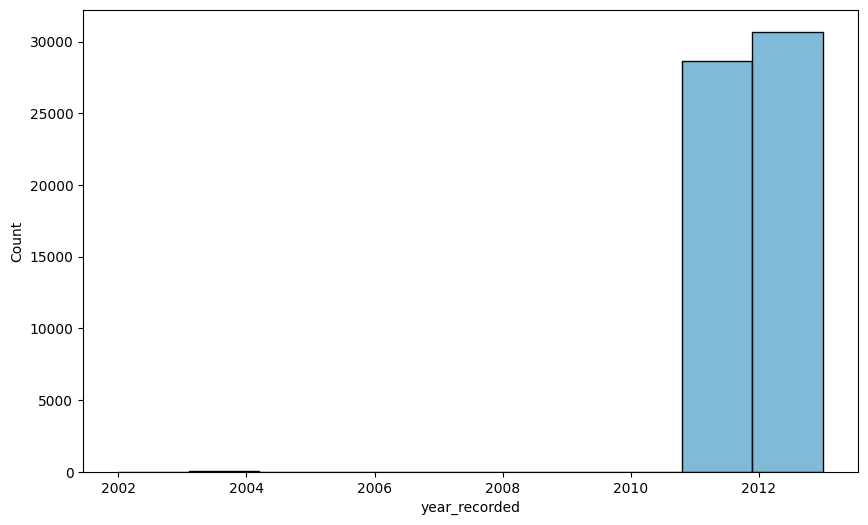

In [14]:
# Convertir a datetime
df['date_recorded'] = pd.to_datetime(df['date_recorded'])

# Extraer componentes numéricos
df['year_recorded'] = df['date_recorded'].dt.year
df['month_recorded'] = df['date_recorded'].dt.month
df['day_recorded'] = df['date_recorded'].dt.day

# Ahora sí puedes hacer histograma del año
plt.figure(figsize=(10, 6))
sns.histplot(df['year_recorded'], bins=10)

Eliminar funder, installer

In [15]:
df = df.drop(columns=['funder', 'installer'])

Longitud y latitud

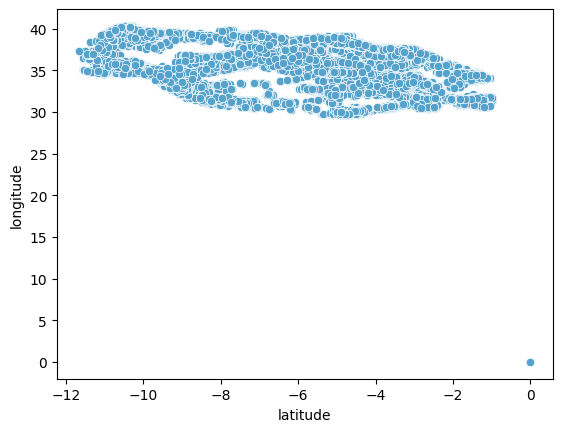

In [16]:
plot=sns.scatterplot(x=df.latitude, y=df.longitude)


Longitude

<Axes: xlabel='longitude', ylabel='Count'>

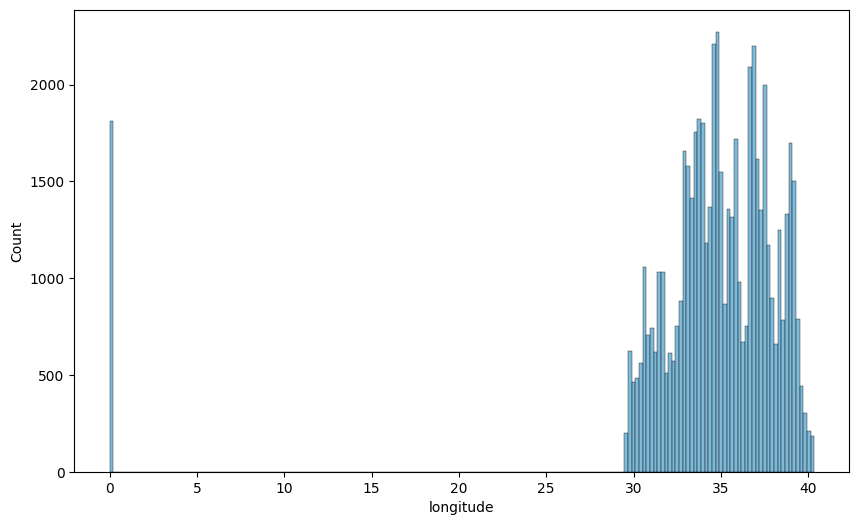

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(df.longitude)

In [18]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum(), df.longitude.value_counts()[0]

(59400, np.int64(0), np.int64(0), np.int64(1812))

<Axes: xlabel='longitude', ylabel='Count'>

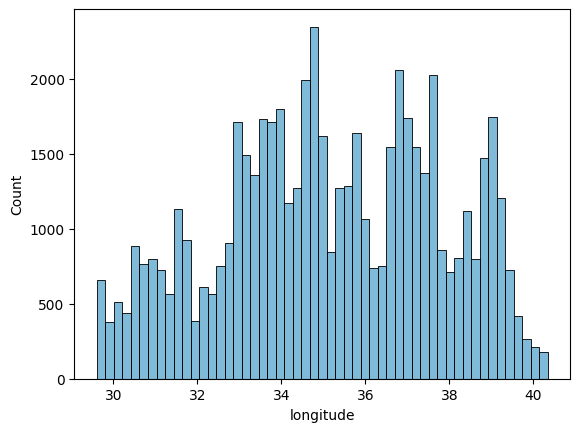

In [19]:
df['longitude']=df['longitude'].replace(0,np.nan)
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()
sns.histplot(df.longitude)

In [20]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()

(59400, np.int64(1812), np.int64(1812))

<Axes: xlabel='longitude', ylabel='Count'>

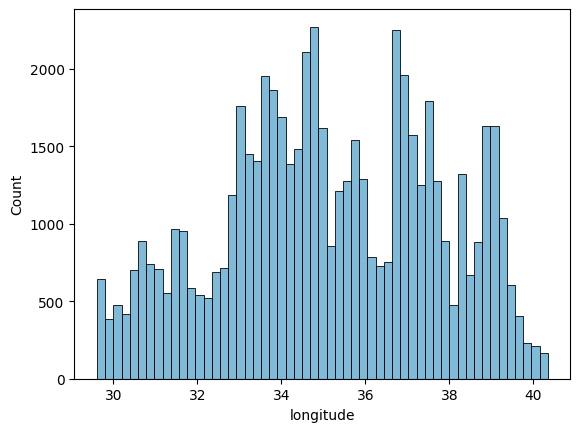

In [21]:
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['subvillage'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['ward'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga'])['longitude'].transform('mean'))

sns.histplot(df.longitude)

In [22]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()

(59400, np.int64(0), np.int64(0))

La razón por la que la segunda agrupación solo tiene subvillage es porque será eliminada en la siguiente iteración de la imputación basada en grupos. Comenzando por la categoría con mayor número de valores únicos, cada categoría será eliminada una por una. Sin embargo, antes de eliminar una columna específica, agrupamos los datos por dicha columna y completamos usando las medias de la columna objetivo (en este caso, longitud). Esto ha producido mejores distribuciones.

Latitude

<Axes: xlabel='latitude', ylabel='Count'>

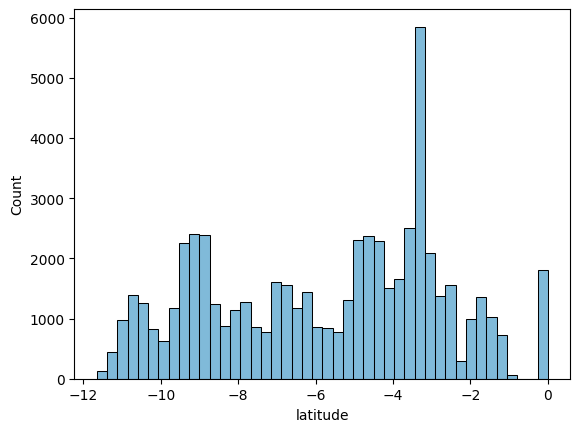

In [23]:
sns.histplot(df.latitude)

In [24]:
len(df.latitude), df.latitude.isna().sum(), df.latitude.isnull().sum()

(59400, np.int64(0), np.int64(0))

<Axes: xlabel='latitude', ylabel='Count'>

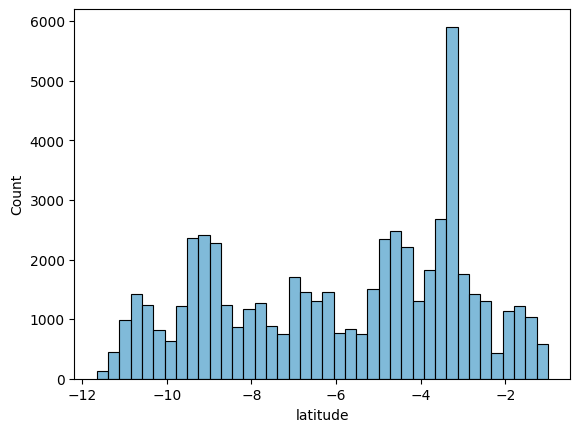

In [25]:
df['latitude']=df['latitude'].replace(-2.000000e-08,np.nan)
sns.histplot(df.latitude)

In [26]:
df.latitude.value_counts()

,count
latitude,
-7.104923,2
-2.480043,2
-6.981326,2
-7.095131,2
-6.958716,2
...,...
-8.234989,1
-3.268579,1
-11.460531,1


El pico entre -4 y -2 de latitud no presenta ninguna anomalía, ya que verificamos con value_counts() y esto es simplemente una coincidencia de que muchas ubicaciones se encuentran en ese intervalo.

<Axes: xlabel='latitude', ylabel='Count'>

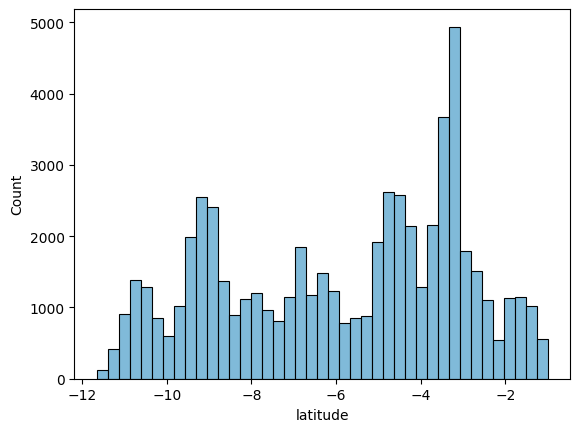

In [27]:
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['subvillage'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region', 'lga','ward'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['ward'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region','lga'])['latitude'].transform('mean'))
sns.histplot(df.latitude)

In [28]:
len(df.latitude), df.latitude.isna().sum(), df.latitude.isnull().sum()

(59400, np.int64(0), np.int64(0))

GPS Height

<Axes: xlabel='gps_height', ylabel='Count'>

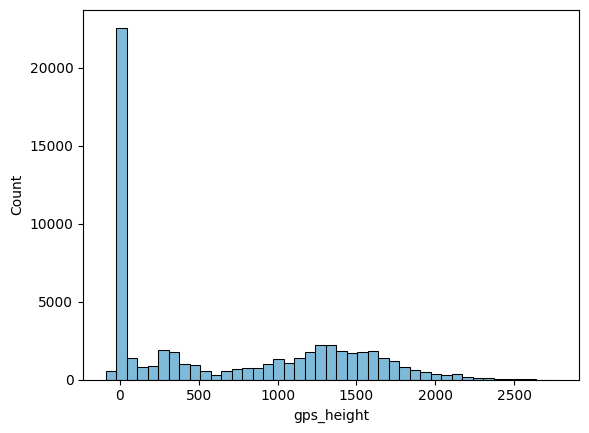

In [29]:
sns.histplot(df.gps_height)

In [30]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum(), df['gps_height'].value_counts()[0]

(59400, np.int64(0), np.int64(0), np.int64(20438))

<Axes: xlabel='gps_height', ylabel='Count'>

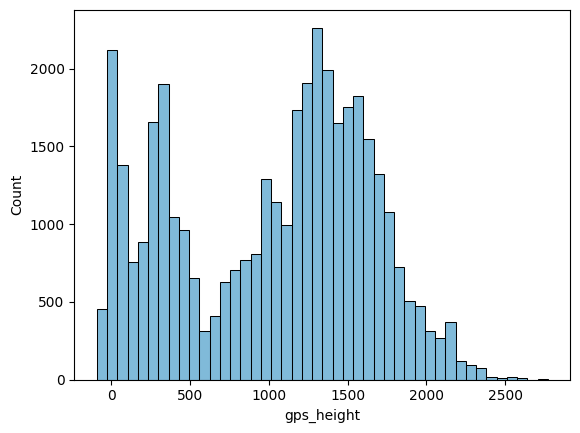

In [31]:
#Corregimos gps heigiht ya que tiene demasiados 0
df['gps_height']=df['gps_height'].replace(0,np.nan) #los 0 pasan a nulos
sns.histplot(df.gps_height) #creamos un histograma

In [32]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum() #verificammos

(59400, np.int64(20438), np.int64(20438))

<Axes: xlabel='gps_height', ylabel='Count'>

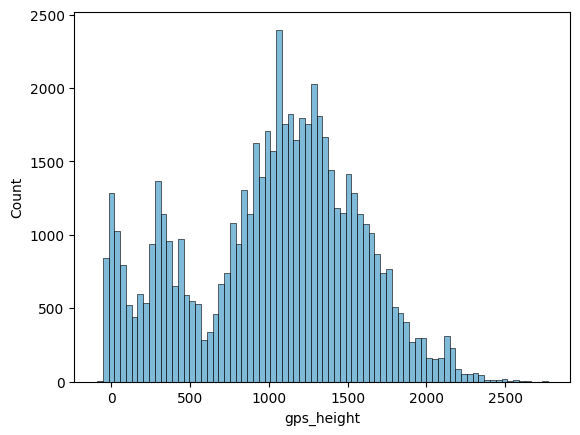

In [33]:
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['subvillage'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga', 'ward'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['ward'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['lga'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region'])['gps_height'].transform('mean'))
sns.histplot(df.gps_height)

In [34]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum()

(59400, np.int64(0), np.int64(0))

In [35]:
df.gps_height.value_counts()

,count
gps_height,
1068.000000,383
449.496680,294
1101.445611,262
1288.802529,261
1067.306869,258
...,...
363.750000,1
405.750000,1
2521.000000,1


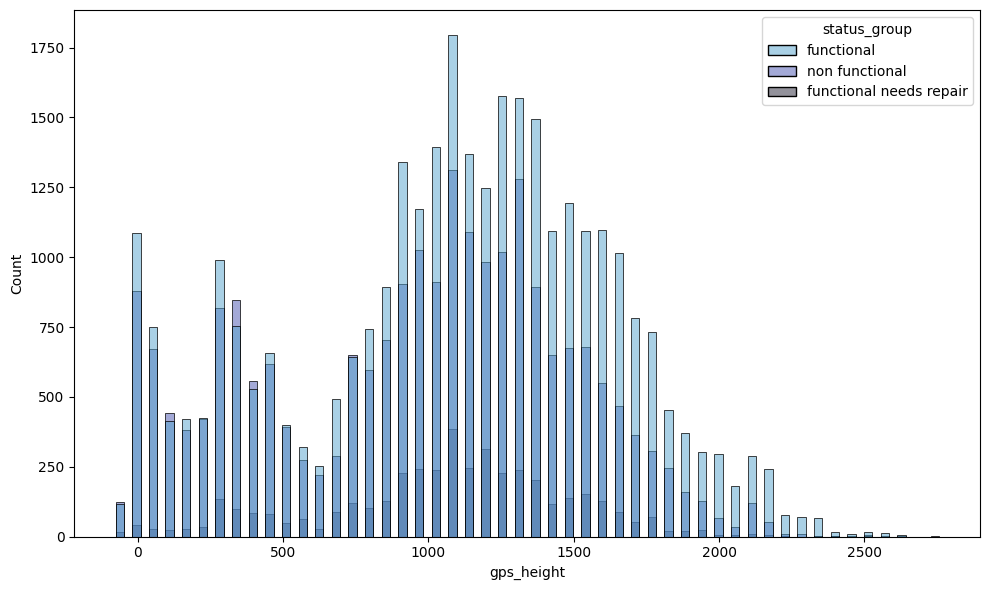

In [36]:
#distribución del gps
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="gps_height", hue="status_group", bins=50, shrink=0.5)

plt.tight_layout()
plt.show()

En las zonas de menor altitud de Tanzania, la proporción de bombas no funcionales es más alta que en las zonas de mayor altitud. La funcionalidad entre 1000 y 2000 metros es mejor.

Population

<Axes: xlabel='population', ylabel='Count'>

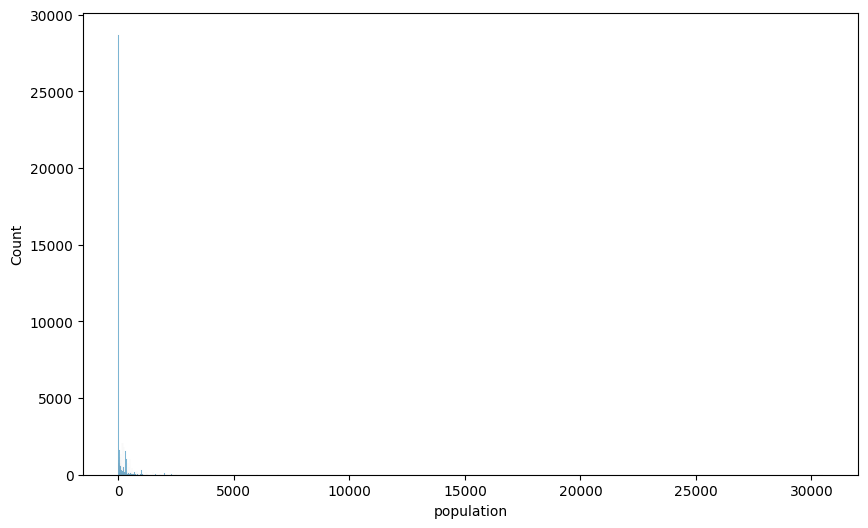

In [37]:
plt.figure(figsize=(10,6))
sns.histplot(df.population)

In [38]:
display_all(df.population.value_counts())

,count
population,
0,21381
1,7025
200,1940
150,1892
250,1681
...,...
605,1
1164,1
3620,1


Existe un número muy alto de ceros y unos en los datos de población. Estos serán eliminados (reemplazados por NaN)

In [39]:
#muchos 0 y 1 remplazados por nan
df['population']=df['population'].replace(0,np.nan)
df['population']=df['population'].replace(1,np.nan)

plt.figure(figsize=(10,6))
sns.histplot(df.population)

## public_meeting, management_group, water_quality, quality_group con gran desbalanceo

In [40]:
unbalanced_cols = ['public_meeting', 'management_group', 'water_quality', 'quality_group']

for column in unbalanced_cols:
    print(df[column].value_counts(normalize=True))
    print('='*50)


public_meeting
True     0.909838
False    0.090162
Name: proportion, dtype: float64
management_group
user-group    0.883670
commercial    0.061246
parastatal    0.029764
other         0.015875
unknown       0.009444
Name: proportion, dtype: float64
water_quality
soft                  0.855522
salty                 0.081751
unknown               0.031582
milky                 0.013535
coloured              0.008249
salty abandoned       0.005707
fluoride              0.003367
fluoride abandoned    0.000286
Name: proportion, dtype: float64
quality_group
good        0.855522
salty       0.087458
unknown     0.031582
milky       0.013535
colored     0.008249
fluoride    0.003653
Name: proportion, dtype: float64


In [41]:
from scipy.stats import chi2_contingency
for column in unbalanced_cols:
    #frequency table
    ctable = pd.crosstab(df[column], df['status_group']) #normalize=1
    print(ctable)
    print('='*70)

    # Chi-square test of independence.
    c, p, dof, expected = chi2_contingency(ctable)
    if p < 0.05:
        print(p,'(Dependiente)')
    else:
        print(p,  '(Independiente)')

    print('='*70)



status_group    functional  functional needs repair  non functional
public_meeting                                                     
False                 2173                      442            2440
True                 28408                     3719           18884
2.4094177307380953e-66 (Dependiente)
status_group      functional  functional needs repair  non functional
management_group                                                     
commercial              2235                      117            1286
other                    528                       56             359
parastatal              1020                      211             537
unknown                  224                       27             310
user-group             28252                     3906           20332
1.744626138526002e-57 (Dependiente)
status_group        functional  functional needs repair  non functional
water_quality                                                          
coloured             

In [42]:
from scipy.stats import chi2_contingency
import numpy as np

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    k = min(confusion_matrix.shape) - 1
    return np.sqrt(chi2 / (n * k))

tablaCramer = pd.DataFrame(
    df.select_dtypes(include=['object', 'category']).apply(
        lambda x: cramers_v(pd.crosstab(x, df['status_group']))
    ),
    columns=['VCramer']
)

tablaCramer.sort_values(by='VCramer', ascending=False).style.background_gradient(cmap='coolwarm').format(precision=2)

,VCramer
status_group,1.00
wpt_name,0.81
subvillage,0.68
scheme_name,0.59
ward,0.47
lga,0.31
quantity,0.31
quantity_group,0.31
waterpoint_type,0.25
extraction_type,0.25


Los resultados obtenidos en el test de contingencia y por el valor de V de Cramer son contradictorios y no logramos determinar si hay una relación significativa o no entre las variables desbalanceadas y la variable objetivo. Por lo tanto, mantendremos las variables en el data set y las incluiremos en el modelo. En caso de que su aporte sea bajo, las eliminaremos, de lo contrario las mantendremos.

Imputar las categóricas menos las que ya fueron imputadas

In [43]:
# Identificar otras columnas numéricas que puedan tener nulos
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
print("Columnas numéricas:", numeric_cols.tolist())
print("Nulos por columna:\n", df[numeric_cols].isnull().sum())

# Imputar el resto con mediana (robusto para outliers)
for col in numeric_cols:
    if df[col].isnull().any() and col not in ['longitude', 'latitude','gps_height']:
        df[col].fillna(df[col].median(), inplace=True)

Columnas numéricas: ['id', 'amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year']
Nulos por columna:
 id                       0
amount_tsh               0
gps_height               0
longitude                0
latitude                 0
num_private              0
region_code              0
district_code            0
population           28406
construction_year        0
dtype: int64


/tmp/ipykernel_607/1726123834.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)


In [44]:
#verificación de todas las numericas
# 1. Identificar todas las columnas numéricas
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

# 2. Ver cuáles tienen nulos todavía
nulos_numericas = df[numeric_cols].isnull().sum()
nulos_numericas = nulos_numericas[nulos_numericas > 0]

if len(nulos_numericas) == 0:
    print(" todas las columnas numéricas están imputadas")
else:
    print(" faltan imputar estas columnas numéricas:")
    print(nulos_numericas)

 todas las columnas numéricas están imputadas


In [45]:
# Imputar todas las categóricas con la moda
for col in df.select_dtypes(include=['object']).columns:
    if df[col].isnull().any():
        df[col].fillna(df[col].mode()[0], inplace=True)
        print(f"{col}: imputada con '{df[col].mode()[0]}'")

# Imputar population con la mediana (variable numérica con zeros/outliers)
df['population'].fillna(df['population'].median(), inplace=True)
print(f"population: imputada con mediana = {df['population'].median():.1f}")

wpt_name: imputada con 'none'
subvillage: imputada con 'Madukani'
public_meeting: imputada con 'True'
scheme_management: imputada con 'VWC'
scheme_name: imputada con 'K'
permit: imputada con 'True'
population: imputada con mediana = 200.0


/tmp/ipykernel_607/1566725627.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
/tmp/ipykernel_607/1566725627.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usi

In [46]:
df.info() # para comprobar de nuevo que todo ha sido imputado correctamente

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     59400 non-null  int64         
 1   amount_tsh             59400 non-null  float64       
 2   date_recorded          59400 non-null  datetime64[ns]
 3   gps_height             59400 non-null  float64       
 4   longitude              59400 non-null  float64       
 5   latitude               59400 non-null  float64       
 6   wpt_name               59400 non-null  object        
 7   num_private            59400 non-null  int64         
 8   basin                  59400 non-null  object        
 9   subvillage             59400 non-null  object        
 10  region                 59400 non-null  object        
 11  region_code            59400 non-null  int64         
 12  district_code          59400 non-null  int64         
 13  l

In [47]:
#outliers

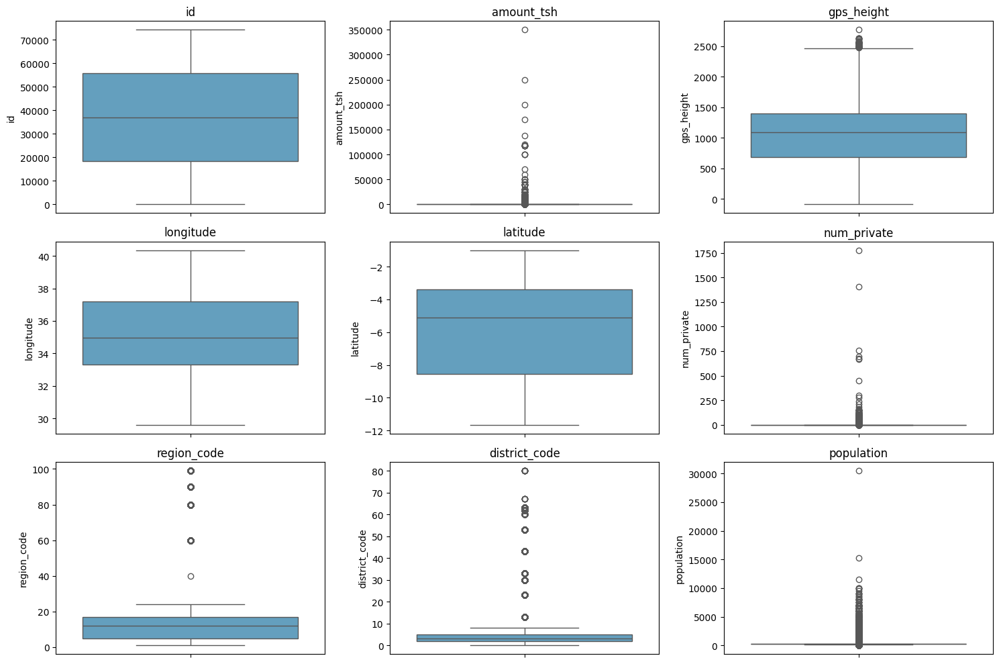

Dimensiones después: (59400, 41)


In [48]:
# Ver outliers en variables numéricas
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols[:9], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

# Capping outliers (sin perder filas)
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    df[col] = df[col].clip(lower, upper)

print(f"Dimensiones después: {df.shape}")

In [49]:
#guardar csv limpio:
df.to_csv('/content/drive/MyDrive/ml_final/df_clean.csv', index=False)
print(f" df_clean.csv guardado con shape: {df.shape}")
print(f"Nulos restantes: {df.isnull().sum().sum()}")

 df_clean.csv guardado con shape: (59400, 41)
Nulos restantes: 0


decidi utilizar algoritmos basados en árboles de decisión, que no se ven afectados por la colinealidad, así que no realizamos ningún tratamiento en este respecto.

In [50]:
#Random Forest

In [51]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score

#  Cargar datos
df   = pd.read_csv("/content/drive/MyDrive/ml_final/df_clean.csv")
test = pd.read_csv("/content/drive/MyDrive/ml_final/test_set.csv")

for frame in [df, test]: #feature engineering
    frame['date_recorded']  = pd.to_datetime(frame['date_recorded'])
    frame['year_recorded']  = frame['date_recorded'].dt.year
    frame['month_recorded'] = frame['date_recorded'].dt.month
    frame['day_recorded']   = frame['date_recorded'].dt.day
    frame.drop(columns=['date_recorded'], inplace=True)  # evita error datetime64

X_train  = df.drop('status_group', axis=1)
y_train  = df['status_group']
test_ids = test['id']

#  Alinear columnas train/test
test = test[X_train.columns]

#  Encoding consistente
categorical_cols = X_train.select_dtypes(include=['object']).columns

encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    le.fit(X_train[col].astype(str))
    X_train[col] = le.transform(X_train[col].astype(str))
    test[col] = test[col].astype(str).map(
        lambda s, le=le: s if s in le.classes_ else le.classes_[0]
    )
    test[col] = le.transform(test[col])
    encoders[col] = le

#  Validación cruzada
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_split=5,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

scores = cross_val_score(rf, X_train, y_train, cv=5, scoring='accuracy')
print(f"CV Accuracy: {scores.mean():.4f} ± {scores.std():.4f}")

#  Entrenar
rf.fit(X_train, y_train)

#  Submission
predicciones = rf.predict(test)
submission = pd.DataFrame({'id': test_ids, 'status_group': predicciones})
submission.to_csv('/content/drive/MyDrive/ml_final/submission.csv', index=False)
print(submission['status_group'].value_counts())

/tmp/ipykernel_607/827446378.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test[col] = test[col].astype(str).map(
/tmp/ipykernel_607/827446378.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test[col] = le.transform(test[col])
/tmp/ipykernel_607/827446378.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

CV Accuracy: 0.8122 ± 0.0032
status_group
functional                 9338
non functional             5088
functional needs repair     424
Name: count, dtype: int64


In [52]:
#XG-BOOST

In [53]:
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score

#Cargar datos
df   = pd.read_csv("/content/drive/MyDrive/ml_final/df_clean.csv")
test = pd.read_csv("/content/drive/MyDrive/ml_final/test_set.csv")

for frame in [df, test]:
    frame['date_recorded']  = pd.to_datetime(frame['date_recorded'])
    frame['year_recorded']  = frame['date_recorded'].dt.year
    frame['month_recorded'] = frame['date_recorded'].dt.month
    frame['day_recorded']   = frame['date_recorded'].dt.day
    frame.drop(columns=['date_recorded'], inplace=True)

X_train  = df.drop('status_group', axis=1)
y_train  = df['status_group']
test_ids = test['id']

#Alinear columnas
test = test[X_train.columns].copy()

# Encoding consistente
categorical_cols = X_train.select_dtypes(include=['object']).columns

encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    le.fit(X_train[col].astype(str))
    X_train[col] = le.transform(X_train[col].astype(str))
    test[col] = test[col].astype(str).map(
        lambda s, le=le: s if s in le.classes_ else le.classes_[0]
    )
    test[col] = le.transform(test[col])
    encoders[col] = le

#  Forzar todo a numérico (elimina cualquier object residual)
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
test    = test.apply(pd.to_numeric, errors='coerce').fillna(0)

#  Encodear el target
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y_train)
print(f"Clases: {le_target.classes_}")

# Modelo XGBoost
xgb = XGBClassifier(
    n_estimators=200,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    min_child_weight=5,
    gamma=0.1,
    reg_alpha=0.1,
    reg_lambda=1.0,
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    random_state=42,
    n_jobs=-1,
    tree_method='hist'
)

#  Cross-validation
scores = cross_val_score(xgb, X_train, y_encoded, cv=3, scoring='accuracy')
print(f"\nCV Accuracy: {scores.mean():.4f} ± {scores.std():.4f}")

#  Entrenar con todos los datos
xgb.set_params(n_estimators=500)
xgb.fit(X_train, y_encoded)

# Predecir y decodificar
pred_encoded = xgb.predict(test)
predicciones = le_target.inverse_transform(pred_encoded)

print(f"\nDistribución de predicciones:")
print(pd.Series(predicciones).value_counts())

#  Submission
submission = pd.DataFrame({'id': test_ids, 'status_group': predicciones})
submission.to_csv('/content/drive/MyDrive/ml_final/submission.csv', index=False)
print("\nsubmission.csv guardado")
print(submission.head())

Clases: ['functional' 'functional needs repair' 'non functional']

CV Accuracy: 0.7808 ± 0.0012

Distribución de predicciones:
functional                 9963
non functional             4621
functional needs repair     266
Name: count, dtype: int64

submission.csv guardado
      id    status_group
0  50785  non functional
1  51630      functional
2  17168      functional
3  45559  non functional
4  49871      functional


In [54]:
#Red neuronal

In [55]:
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score

#  Cargar datos
df   = pd.read_csv("/content/drive/MyDrive/ml_final/df_clean.csv")
test = pd.read_csv("/content/drive/MyDrive/ml_final/test_set.csv")

for frame in [df, test]:
    frame['date_recorded']  = pd.to_datetime(frame['date_recorded'])
    frame['year_recorded']  = frame['date_recorded'].dt.year
    frame['month_recorded'] = frame['date_recorded'].dt.month
    frame['day_recorded']   = frame['date_recorded'].dt.day
    frame.drop(columns=['date_recorded'], inplace=True)

X_train  = df.drop('status_group', axis=1)
y_train  = df['status_group']
test_ids = test['id']

# Alinear columnas
test = test[X_train.columns].copy()

#  Encoding consistente
categorical_cols = X_train.select_dtypes(include=['object']).columns

encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    le.fit(X_train[col].astype(str))
    X_train[col] = le.transform(X_train[col].astype(str))
    test[col] = test[col].astype(str).map(
        lambda s, le=le: s if s in le.classes_ else le.classes_[0]
    )
    test[col] = le.transform(test[col])
    encoders[col] = le

#  Forzar todo a numérico (elimina cualquier object residual) ──
X_train = X_train.apply(pd.to_numeric, errors='coerce').fillna(0)
test    = test.apply(pd.to_numeric, errors='coerce').fillna(0)

#  Encodear el target
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y_train)
print(f"Clases: {le_target.classes_}")

# Modelo XGBoost
xgb = XGBClassifier(
    n_estimators=200,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    min_child_weight=5,
    gamma=0.1,
    reg_alpha=0.1,
    reg_lambda=1.0,
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    random_state=42,
    n_jobs=-1,
    tree_method='hist'
)

#  Cross-validation
scores = cross_val_score(xgb, X_train, y_encoded, cv=3, scoring='accuracy')
print(f"\nCV Accuracy: {scores.mean():.4f} ± {scores.std():.4f}")

#  Entrenar con todos los datos
xgb.set_params(n_estimators=500)
xgb.fit(X_train, y_encoded)

#  Predecir y decodificar
pred_encoded = xgb.predict(test)
predicciones = le_target.inverse_transform(pred_encoded)

print(f"\nDistribución de predicciones:")
print(pd.Series(predicciones).value_counts())

#  Submission
submission = pd.DataFrame({'id': test_ids, 'status_group': predicciones})
submission.to_csv('/content/drive/MyDrive/ml_final/submission.csv', index=False)
print("\n submission.csv guardado")
print(submission.head())

Clases: ['functional' 'functional needs repair' 'non functional']

CV Accuracy: 0.7808 ± 0.0012

Distribución de predicciones:
functional                 9963
non functional             4621
functional needs repair     266
Name: count, dtype: int64

 submission.csv guardado
      id    status_group
0  50785  non functional
1  51630      functional
2  17168      functional
3  45559  non functional
4  49871      functional
